In [1]:
from apy import *
from apy.amedia import *
import torchvision.transforms as transforms
import torch as th
from fgdex import *
sys.path.append(os.path.abspath('../'))
import StableDiffusion
import Text2Im
from apy.utils import *
import Img2Img
import os

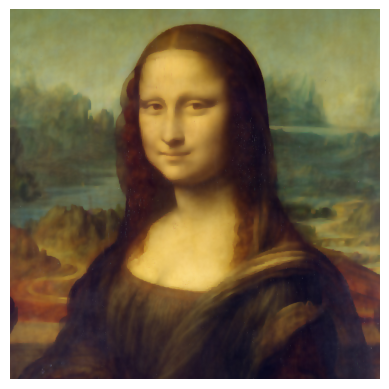

In [2]:
guide_image = GuideImage("monalisa.jpg")
guide_image.show()
# guide_image.show()
# guide_image._scaled.show()
# guide_image._mask.show()


In [3]:
def WriteFramesToPath(frames_in, path, fps=30):
    opath = path;
    vw = VideoWriter(opath, fps);
    for frame in frames_in:
        vw.writeFrame(frame)
    vw.close()
    return Video(opath);

## The main function of importance is p_sample

it gets called from gaussian_diffusion.py in `p_sample`:

```python
...
t_value = t[0].item();
sqrt_alpha_cumprod = self.sqrt_alphas_cumprod[t_value];
sample = self.experiment.p_sample(sample=sample, mean=out["mean"], noise=noise, t=t_value, sqrt_alpha_cumprod=sqrt_alpha_cumprod, log_variance=out["log_variance"]);
...
```

In [4]:
import numbers

class SDFGDExperiment(FGDExperiment):
    def __init__(self, path=None, **kwargs):
        super(SDFGDExperiment, self).__init__(path=path, **kwargs);
        self.mask_strength = 1.0;
        self.weights_used = [];
        self.alphas = [];
        self.use_experimentfunc = False;
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.use_FGD = True


    def Filter(self, sampler, sampleim, meanim, use_original_steps, t):
        self.timesteps.append(t);
        bs, ch, h, w = meanim.size()
        meanim = sampleim
        meanim = meanim[0]
        # 4x1x4096
        meanim_structure = meanim.reshape((ch, 1, h*w))
        # 4x1x4096
        meanim_structure = torch.bmm(meanim_structure, self.guide_image.jbm)
        meanim_structure = meanim_structure.reshape((ch, h, w))

        alphas = sampler.model.alphas_cumprod if use_original_steps else sampler.ddim_alphas
        self.alphas = alphas;
        a_t =  alphas[t]
        sqrt_alpha_cumprod = a_t.sqrt()

        # if first round, set replacement strength to 0
        if(len(self.structure_residuals)<1):
            weight = 1
            weight_control = 1;
            self.weight_schedule.append(1)
        else:
            # look at the previous error
            lastError = self.structure_residuals[-1]

            # control weight scales as structure residual gets close to self.target_dstructure
            # this naming isn't great
            weight_control = np.clip(lastError / self.target_detail, 0, 1)
            weight_control = weight_control ** self.guidance_exponent
            # optionally raise to some exponent. exponent>1 will make control more lenient
            # weigh the control by the estimated signal strength
            weight = weight_control * sqrt_alpha_cumprod

            # add weight to record of schedule
            self.weight_schedule.append(weight_control)

        do_normalize = False;
        ng = self.normalize_guidance;
        if(isinstance(ng, numbers.Number)):
            if(t<=self.t_start and (self.t_start-t)<ng):
                do_normalize = "Whiten";
        
        if(do_normalize=="Whiten" or self.normalize_guidance==True):
            latent_target_structure = self.guide_image.latent_structure;
            target_mean = torch.mean(latent_target_structure, (1,2), keepdim=True)
            target_std = torch.std(latent_target_structure, (1,2), keepdim=True)
            meanim_mean = torch.mean(meanim_structure, (1,2), keepdim=True)
            meanim_std = torch.std(meanim_structure, (1,2), keepdim=True)
            target_structure = (latent_target_structure-target_mean) / target_std
            target_structure = target_structure * meanim_std + meanim_mean
            d_structure = target_structure - meanim_structure
            if(do_normalize=="Whiten"):
                print("Whitening at step {}".format(t))
        elif(self.normalize_guidance=="STDs"):
            latent_target_structure = self.guide_image.latent_structure;
            target_mean = torch.mean(latent_target_structure, (1,2), keepdim=True)
            target_std = torch.std(latent_target_structure, (1,2), keepdim=True)
            meanim_mean = torch.mean(meanim_structure, (1,2), keepdim=True)
            meanim_std = torch.std(meanim_structure, (1,2), keepdim=True)
            target_structure = (latent_target_structure-target_mean) / target_std
            target_structure = target_structure * meanim_std + meanim_mean
            d_structure = target_structure - meanim_structure
        else:
            target_structure = self.guide_image.latent_structure*sqrt_alpha_cumprod;
            [d_structure, weight] = self.calcDStructure(target_structure, meanim_structure, t, weight, weight_control);

        # measure structure residual
        d_structure_value = torch.norm(d_structure, p=1).item()/np.prod(d_structure.size())

        # record structure residual for later. like a squirrel stashing away an acord. bit it's a structure residual norm.
        self.structure_residuals.append(d_structure_value)
        
        # new mean is mean plus weight times the change in structure
        newmean = meanim + weight * d_structure

        if t > self.t_start or t <= self.t_end:
            print("Skipping {}".format(t))
            return sampleim
        return newmean

            
    @property
    def xT_latent(self):
        return self.getInfo("xT_latent");

    @xT_latent.setter
    def xT_latent(self, value):
        self.setInfo('xT_latent', value);
        

    
    # <editor-fold desc="Property: 'normalize'">
    @property
    def normalize_guidance(self):
        return self.getInfo("normalize_guidance");
    @normalize_guidance.setter
    def normalize_guidance(self, value):
        self.setInfo('normalize_guidance', value);
    # </editor-fold>
    
    # <editor-fold desc="Property: 'guidance_exponent'">
    @property
    def guidance_exponent(self):
        return self.getInfo("guidance_exponent");
    @guidance_exponent.setter
    def guidance_exponent(self, value):
        self.setInfo('guidance_exponent', value);
    # </editor-fold>
        
    
    def Evaluate(self):
        if self.xT_latent:
            self.xT_latent = self.xT_latent.to(self.device)
        return Text2Im.Text2Im(
            experiment=self,
            **self.extra_args
        );
    
    def EvaluateDDIM(self):
        if self.xT_latent:
            self.xT_latent = self.xT_latent.to(self.device)
        return Img2Img.Img2Img(
            experiment=self,
            **self.extra_args
        );
    
    
    def result_png_path(self, result_dir):
        return os.path.join(result_dir, self.GetParamString(**self.getParamDict())+".png")
    
    def plot_png_path(self, result_dir):
        return os.path.join(result_dir, self.GetParamString(**self.getParamDict())+"_plot.png")
    
    def WriteResults(self, result_dir):
        Image(pixels=self.grid_results[0]).writeToFile(self.result_png_path(result_dir))
        #Image(pixels=self.grid_results[0]).show()
        self.showdStructureValues()
        plt.savefig(os.path.join(result_dir, self.GetParamString(**self.getParamDict())+"_plot.pdf"))
        plt.savefig(self.plot_png_path(result_dir))
        return Image(self.plot_png_path(result_dir));
        
    
    def getParamDict(self):
        d = super(SDFGDExperiment,self).getParamDict();
        d["normalize_guidance"]=self.normalize_guidance;
        d["guidance_exponent"] = self.guidance_exponent;
        d["guide_image"] = self.guide_image
        return d;
    
    
    def setParameters(self,
                      normalize_guidance=True,
                      guidance_exponent=1.0,
                      xT_latent=None,
                      **kwargs):
        super(SDFGDExperiment, self).setParameters(**kwargs);
        self.normalize_guidance = normalize_guidance;
        self.guidance_exponent=guidance_exponent;
        self.xT_latent = xT_latent
        
    
    @classmethod
    def GetParamString(cls,
                       guide_image=None,
                       guide_text='',
                       sigmas=[5,5,0.1],
                       t_total=100,
                       t_start=100,
                       t_end=50,
                       seed=2,
                       guidance_scale=0.0,
                       sampler='ddpm',
                       target_detail=0.4,
                       normalize_guidance=True,
                       guidance_exponent=1.0,
                       **kwargs):
        print(kwargs)
        return "{}_{}_p-{}_s-{}_sigx{:.2f}y{:.2f}v{:.3f}_tse-{}-{}-{})_dtail{}_norm{}_s{}_ge{}".format(
            cls.__name__,
            guide_image.file_name_base,
            guide_text,
            seed,
            sigmas[0],
            sigmas[1],
            sigmas[2],
            t_total,
            t_start,
            t_end,
            target_detail,
            normalize_guidance,
            guidance_exponent,
            sampler
        )
    
    def showdStructureValues(self):
        ts =np.array(self.timesteps);
        plt.figure(figsize=[5,5])
        ax1 = plt.subplot(211)
        plot = plt.plot(
            ts[:len(self.structure_residuals)], self.structure_residuals
        );
        plt.xlim(ts.max(), ts.min())
        ax2 = plt.subplot(212)
        plt.plot(ts[:len(self.weight_schedule)], self.weight_schedule);
        plt.xlim(ts.max(), ts.min())
        ax1.set_ylabel("Residuals")
        ax2.set_ylabel("$\lambda$")
        plt.suptitle("{} | $\gamma$: {}".format(self.guide_text, self.target_detail))
    
    
    def calcDStructure(self, target_structure, meanim_structure, t, weight, weight_control):
        #d_structure = target_structure - meanim_structure
#         scale = self.alphas[t].sqrt();
        scale=1.0;
        d_structure = target_structure*scale - meanim_structure;
        return [d_structure, weight];
        
        
        if(self.normalize_guidance is True):
            d_structure = target_structure - meanim_structure;
        else:
            scale = self.alphas[t].sqrt();
            latent_target_structure = self.guide_image.latent_structure*scale;
            target_mean = torch.mean(latent_target_structure, (1,2), keepdim=True)
            meanim_mean = torch.mean(meanim_structure, (1,2), keepdim=True)
            latent_target_structure = (latent_target_structure-target_mean+meanim_mean);
            d_structure = latent_target_structure - meanim_structure;


        return [d_structure, weight];
    
    
    def setGuideLatent(self, model):
        if self.guide_image:
            if(self.guide_image.latent_im is None):
                init_image = Text2Im.load_img(self.guide_image.absolute_file_path).to(self.device)
                #convert the guidance image to latent space
                init_latent = model.get_first_stage_encoding(model.encode_first_stage(init_image))
                # _, ch, h, w = init_latent.size()
                self.guide_image.latent_dim = init_latent.size();
                [_, ch, h, w] = self.guide_image.latent_dim;
                init_latent = init_latent.reshape((ch, 1, h*w))
                self.guide_image.latent_im = init_latent;
                #1x4x64x64
                print('guidance image latent feature', init_latent.size())
            else:
                [_, ch, h, w] = self.guide_image.latent_dim;
                init_latent = self.guide_image.latent_im;

            # _, ch, h, w = init_latent.size()
            #cross bilat kernel, size 4x4096
            if(self.guide_image.jbmsigmas == self.sigmas):
                print("Reusing JBM for sigmas {}".format(self.sigmas));
            else:
                cbm = self.guide_image.getCrossBilateralMatrix(self.sigmas);
                self.guide_image.setJBM(torch.Tensor(cbm).unsqueeze(0).repeat((ch, 1,1)).to(self.device), self.sigmas);
                # sampler.target_structure = torch.bmm(init_latent, sampler.cbm).reshape((ch, h, w))

            if(self.guide_image.latent_structure is None):
                init_latent = init_latent.reshape((ch, 1, h*w))
                self.guide_image.latent_structure = torch.bmm(init_latent, self.guide_image.jbm).reshape((ch, h, w))
                
                

### Running an experiment
`normalize_guidance` is the number of iterations to do the normalization on


In [5]:
result_dir = "./May20Result_{}/".format(guide_image.file_name_base)
make_sure_dir_exists(result_dir);


def runseed(seed=42, t_end=10, target_detail=0.5, guide_im = None):
    if(guide_im is None):
        guide_im = guide_image;
    experiment = SDFGDExperiment.Create(
        directory = result_dir,
        plms=True,
        guide_image=guide_im,
        guide_text="a portrait of a steam punk robot girl with long hair in a dress",
        target_detail=target_detail,
        t_end=t_end,
        sigmas=[5,5, 0.35],
        t_total=50,
        t_start=50,
        normalize_guidance = 3,
        guidance_exponent=1.0,
        seed=seed)
#     experiment.use_experimentfunc= True
    exp = experiment.Evaluate()
    resultim = Image(pixels=experiment.grid_results[0])
    # experiment.showdStructureValues()
    experiment.WriteResults(result_dir)
    return resultim;

# rim = runseed(16, t_end=25, target_detail=0.3)
# rim = runseed(seed=8, t_end=25, target_detail=0.2)
# rim.show()


# rims = [];
# for a in range(25):
#     rim = runseed(a, t_end=25, target_detail=0.3)
#     rims.append(runseed(a));
    



In [6]:
# rim.show()

In [ ]:
output_dirname='../outputs_param_search_SDEdit+FGD'
#dataset dir
parent_dir = '../dataset/param_search/'
styles = open(parent_dir+'styles.txt').readline().split(', ')

spatial_std=5
value_std=0.35
t_ends=[10, 25]
t_starts=[50]
normalize_guidances=[3, 1]
d_structures=[0.05, 0.2, 0.5]
use_xT = False
plms = False
SDEdit_strengths = [0.75,0.85, 0.6]
os.makedirs(output_dirname, exist_ok=True)

entire_times, exe_times=[],[]
for f in sorted(os.listdir(parent_dir)):
    if f in os.listdir(output_dirname):
        user_decision = input(output_dirname, f, 'already exists, overwrite? [Y/N]')
        if user_decision != 'Y':
            print("No overwrite, aborting...")
            sys.exit()

    data_dir = parent_dir + f
    if not os.path.isdir(data_dir):
        print(data_dir, 'is not a data folder!')
        continue
    for img_f in os.listdir(data_dir):
        if ('jpg' in img_f) or ('png' in img_f) or ('jpeg' in img_f):
            guide_im = GuideImage(os.path.join(data_dir, img_f))

    try:
        objects = open(os.path.join(data_dir, 'untitled.txt')).readline().split(', ')
    except:
        print('no untitled.txt!')
        continue

    if use_xT:
        xT_latent = torch.load(os.path.join(data_dir, 'z_enc.pt'))
    else:
        xT_latent = None
        
    for style in styles:
        for obj in objects:
            prompt = style +' '+ obj
            prompt_dir = os.path.join(output_dirname, f, prompt)
            bilat_dir = os.path.join(prompt_dir, 'b'+'_'.join([str(spatial_std), str(value_std)]))
            for t_start in t_starts:
                for t_end in t_ends:
                    if t_start - t_end > 0:
                        time_dir = os.path.join(bilat_dir, 't'+'_'.join([str(t_start), str(t_end)]))
                        for d_structure in d_structures:
                            structure_dir = os.path.join(time_dir, 's'+str(d_structure))

                            for normalize_guidance in normalize_guidances:
                                norm_dir = os.path.join(structure_dir, 'n'+str(normalize_guidance))
                                for strength in SDEdit_strengths:
                                    output_dir = os.path.join(norm_dir, 'sde'+str(strength))
                                    print(output_dir)
                                    os.makedirs(output_dir, exist_ok=True)
                                    start = time.time()
                                    experiment = SDFGDExperiment.Create(
                                        directory = output_dir,
                                        plms=plms,
                                        guide_image=guide_im,
                                        guide_text=prompt,
                                        target_detail=d_structure,
                                        t_end=t_end,
                                        sigmas=[spatial_std, spatial_std, value_std],
                                        t_total=50,
                                        t_start=t_start,
                                        normalize_guidance = normalize_guidance,
                                        guidance_exponent=1.0,
                                        seed=8,
                                        xT_latent=xT_latent,
                                        strength=strength
                                        )
                                    exp = experiment.EvaluateDDIM()
                                    entire_times.append(time.time()-start)
                                    exe_times.append(experiment.exe_time)
                                    print('time', entire_times[-1], exe_times[-1])
                                    resultim = Image(pixels=experiment.grid_results[0])
                                    experiment.WriteResults(output_dir)
                                    resultim.writeToFile(os.path.join(output_dir, 'generated.png'))

                                


../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb08c65d6d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   3%|█▌                                                        | 1/37 [00:00<00:06,  5.16it/s]

Decoding image:   8%|████▋                                                     | 3/37 [00:00<00:03,  8.83it/s]

Decoding image:  14%|███████▊                                                  | 5/37 [00:00<00:03, 10.14it/s]

Decoding image:  19%|██████████▉                                               | 7/37 [00:00<00:02, 10.75it/s]

Decoding image:  24%|██████████████                                            | 9/37 [00:00<00:02, 11.10it/s]

Decoding image:  30%|████████████████▉                                        | 11/37 [00:01<00:02, 11.32it/s]

Decoding image:  35%|████████████████████                                     | 13/37 [00:01<00:02, 11.45it/s]

Decoding image:  41%|███████████████████████                                  | 15/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  84%|███████████████████████████████████████████████▊         | 31/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  89%|██████████████████████████████████████████████████▊      | 33/37 [00:02<00:00, 11.70it/s]

Decoding image:  95%|█████████████████████████████████████████████████████▉   | 35/37 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.33it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.39s/it]

Skipping 1
Skipping 0
20.30266761779785
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb079d0e3a0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.71it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.74it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.74it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.75it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.71it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
19.497015953063965
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb08c949ee0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.72it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.73it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.73it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.73it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.74it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]

Skipping 1
Skipping 0
18.17760181427002
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb08c65d1f0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
18.182459354400635
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078fd6df0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.386250019073486
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb079f2dcd0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.337624311447144
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb079aa2370>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.794856786727905
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078d56e20>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   2%|█▍                                                        | 1/42 [00:00<00:04,  9.92it/s]

Decoding image:   7%|████▏                                                     | 3/42 [00:00<00:03, 11.24it/s]

Decoding image:  12%|██████▉                                                   | 5/42 [00:00<00:03, 11.47it/s]

Decoding image:  17%|█████████▋                                                | 7/42 [00:00<00:03, 11.57it/s]

Decoding image:  21%|████████████▍                                             | 9/42 [00:00<00:02, 11.62it/s]

Decoding image:  26%|██████████████▉                                          | 11/42 [00:00<00:02, 11.65it/s]

Decoding image:  31%|█████████████████▋                                       | 13/42 [00:01<00:02, 11.66it/s]

Decoding image:  36%|████████████████████▎                                    | 15/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  83%|███████████████████████████████████████████████▌         | 35/42 [00:03<00:00, 11.69it/s]

Decoding image:  88%|██████████████████████████████████████████████████▏      | 37/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  93%|████████████████████████████████████████████████████▉    | 39/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.33403182029724
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078ae5af0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.75761127471924
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb079ec5b80>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.828357696533203
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0732c0400>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   2%|█▍                                                        | 1/42 [00:00<00:04,  9.34it/s]

Decoding image:   7%|████▏                                                     | 3/42 [00:00<00:03, 11.04it/s]

Decoding image:  12%|██████▉                                                   | 5/42 [00:00<00:03, 11.36it/s]

Decoding image:  17%|█████████▋                                                | 7/42 [00:00<00:03, 11.50it/s]

Decoding image:  21%|████████████▍                                             | 9/42 [00:00<00:02, 11.57it/s]

Decoding image:  26%|██████████████▉                                          | 11/42 [00:00<00:02, 11.61it/s]

Decoding image:  31%|█████████████████▋                                       | 13/42 [00:01<00:02, 11.64it/s]

Decoding image:  36%|████████████████████▎                                    | 15/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  83%|███████████████████████████████████████████████▌         | 35/42 [00:03<00:00, 11.68it/s]

Decoding image:  88%|██████████████████████████████████████████████████▏      | 37/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  93%|████████████████████████████████████████████████████▉    | 39/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.12251091003418
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0785ffe20>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.49it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.557273864746094
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07936faf0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
18.23018169403076
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0797d0a30>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.120779275894165
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0797029d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.18843913078308
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb079702c10>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
18.023990869522095
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078f1dca0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
19.167033672332764
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07970b490>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.49it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.01313352584839
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0737c0190>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.47it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.58it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.67it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.651198148727417
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb079210730>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.50it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.432114839553833
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0727b9460>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.63it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.432377815246582
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0784d5490>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.68it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.69it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.69it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.724104404449463
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07979be20>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.69it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.919736623764038
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078ce5fa0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.68it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.113709449768066
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072da3850>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.69it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.74818444252014
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078ed3fd0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.17it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.46it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.56it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.60it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.61it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.62it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.63it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.62it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.63it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.62it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.62it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.534842252731323
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07848afd0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.58it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.61it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.157245635986328
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb079800490>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.67it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.62it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.613420248031616
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072f7a820>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.66it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.163559436798096
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078cb8190>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.26476287841797
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0725276a0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.50it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.59it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.69it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.68it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
18.089778184890747
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078e224c0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.49it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.58it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.63it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.68it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.62it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.276469707489014
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0735f4460>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.133342266082764
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072b79be0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.19it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.603362798690796
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0726d0e80>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.18it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.48it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.264154195785522
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb079251eb0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.57it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.576658010482788
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072a38460>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.72270965576172
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071c1fdf0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.49it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.58it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.61it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.190994024276733
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0730847c0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.041646003723145
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072f91f70>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.50it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.57it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.618475914001465
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07300e370>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.50it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.49143099784851
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0725b0b50>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.344962120056152
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0718f5700>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.89612627029419
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0789b1df0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.23471474647522
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071ca7b50>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.18741250038147
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072bf1e50>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
18.022821187973022
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb073369490>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.047470331192017
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070fef100>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.128218412399292
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07276a220>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.855490922927856
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0725f5df0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.296222448349
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072825dc0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.47it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.57it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.22571587562561
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071312340>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.42it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.53it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.62it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
18.073359966278076
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb073084910>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.17027759552002
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0725eb9a0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.19it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
16.968547582626343
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071f612b0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.50it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.58it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.60it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.62it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.64it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.63480496406555
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071638dc0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.248543739318848
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0711ee310>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.66it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.226892948150635
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070c0f100>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.49it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.58it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.64it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
18.104764938354492
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0788ccfa0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.138745307922363
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb03697e700>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.090832233428955
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072713490>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.08it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.46it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.56it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.60it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.31s/it]

Skipping 1
Skipping 0
17.69823694229126
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070eb9340>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.17it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.06671905517578
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070f76c10>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.00869369506836
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071281a00>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.67it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.92364811897278
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb03697ec40>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.073795080184937
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078b87430>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.18it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.66it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.072778701782227
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070c8c4c0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.680351734161377
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0363cddc0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.198235273361206
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0715af520>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.246257066726685
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072ce2af0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.67it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.787698984146118
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036b95f40>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.565419673919678
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0712e9a60>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.18it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.57it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.08220624923706
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036c027c0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.537270545959473
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcde7c9a0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.002315044403076
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036086fa0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.017322063446045
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0736eabb0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.891860246658325
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07366dca0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.25708818435669
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd7e2b20>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.52it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.500563383102417
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcdc8a100>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.678511142730713
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07116bee0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.110910415649414
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0362af310>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.189024686813354
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0368703a0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.19it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.609564065933228
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcdd39a00>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.187493562698364
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0368582b0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.956361293792725
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0360e0dc0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.993135690689087
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036b12d00>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.19it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.46it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.56it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.61it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.995357036590576
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070ba3c70>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   3%|█▉                                                        | 1/30 [00:00<00:02,  9.68it/s]

Decoding image:  10%|█████▊                                                    | 3/30 [00:00<00:02, 11.17it/s]

Decoding image:  17%|█████████▋                                                | 5/30 [00:00<00:02, 11.45it/s]

Decoding image:  23%|█████████████▌                                            | 7/30 [00:00<00:01, 11.55it/s]

Decoding image:  30%|█████████████████▍                                        | 9/30 [00:00<00:01, 11.60it/s]

Decoding image:  37%|████████████████████▉                                    | 11/30 [00:00<00:01, 11.63it/s]

Decoding image:  43%|████████████████████████▋                                | 13/30 [00:01<00:01, 11.64it/s]

Decoding image:  50%|████████████████████████████▌                            | 15/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  77%|███████████████████████████████████████████▋             | 23/30 [00:01<00:00, 11.66it/s]

Decoding image:  83%|███████████████████████████████████████████████▌         | 25/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▎     | 27/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.07465624809265
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0365fd280>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.643393516540527
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd091520>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.035529851913452
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036a00e20>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.11it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.47it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]

Skipping 1
Skipping 0
17.14441466331482
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0789c6b20>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.67it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.73745346069336
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07332f2b0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.51it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.166370630264282
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036c35940>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.68it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.6401584148407
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071062340>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.17it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.67it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.63it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.614986419677734
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd66a880>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.105202436447144
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071b0dca0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.57it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.65it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
18.130486726760864
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0365e8c10>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.50it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.57it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.54888606071472
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb073398d90>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.68it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.113743782043457
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd5d42b0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.156376123428345
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0791b9c10>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.65it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.709495067596436
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078e99640>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.12it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.49it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.58it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.74s/it]

Skipping 1
Skipping 0
18.669562816619873
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb078e99610>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.52it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.081696271896362
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcda49a60>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.67it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.543313026428223
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafccd949d0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.193702459335327
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd19ef70>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.161478757858276
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036129070>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.65it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.68it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.628575563430786
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd980d90>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.97170400619507
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd8a3880>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   3%|█▉                                                        | 1/30 [00:00<00:02,  9.99it/s]

Decoding image:  10%|█████▊                                                    | 3/30 [00:00<00:02, 11.27it/s]

Decoding image:  17%|█████████▋                                                | 5/30 [00:00<00:02, 11.49it/s]

Decoding image:  23%|█████████████▌                                            | 7/30 [00:00<00:01, 11.58it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  30%|█████████████████▍                                        | 9/30 [00:00<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  37%|████████████████████▉                                    | 11/30 [00:00<00:01, 11.65it/s]

Decoding image:  43%|████████████████████████▋                                | 13/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  50%|████████████████████████████▌                            | 15/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  57%|████████████████████████████████▎                        | 17/30 [00:01<00:01, 11.67it/s]

Decoding image:  63%|████████████████████████████████████                     | 19/30 [00:01<00:00, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  70%|███████████████████████████████████████▉                 | 21/30 [00:01<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  77%|███████████████████████████████████████████▋             | 23/30 [00:01<00:00, 11.68it/s]

Decoding image:  83%|███████████████████████████████████████████████▌         | 25/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▎     | 27/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.834822416305542
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcdde37c0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.537440299987793
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcca55cd0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.397243976593018
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafccb10d30>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.49it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.57it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.041045665740967
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0784997c0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.50it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.58it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.61966371536255
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafccb91c40>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.17it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.47it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.57it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.61it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.106971263885498
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb976b20>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.57it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.64it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.224643230438232
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd2bc820>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.6241934299469
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd12c7c0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.095301389694214
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc1bb490>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.143516540527344
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb03612ce80>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   3%|█▌                                                        | 1/37 [00:00<00:03,  9.66it/s]

Decoding image:   8%|████▋                                                     | 3/37 [00:00<00:03, 11.13it/s]

Decoding image:  14%|███████▊                                                  | 5/37 [00:00<00:02, 11.41it/s]

Decoding image:  19%|██████████▉                                               | 7/37 [00:00<00:02, 11.52it/s]

Decoding image:  24%|██████████████                                            | 9/37 [00:00<00:02, 11.57it/s]

Decoding image:  30%|████████████████▉                                        | 11/37 [00:00<00:02, 11.60it/s]

Decoding image:  35%|████████████████████                                     | 13/37 [00:01<00:02, 11.63it/s]

Decoding image:  41%|███████████████████████                                  | 15/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  84%|███████████████████████████████████████████████▊         | 31/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  89%|██████████████████████████████████████████████████▊      | 33/37 [00:02<00:00, 11.67it/s]

Decoding image:  95%|█████████████████████████████████████████████████████▉   | 35/37 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.717819213867188
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcbe10af0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.710691213607788
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb9775b0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.902503728866577
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd30f850>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.556106328964233
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc02d6a0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   2%|█▍                                                        | 1/42 [00:00<00:04,  9.38it/s]

Decoding image:   7%|████▏                                                     | 3/42 [00:00<00:03, 11.04it/s]

Decoding image:  12%|██████▉                                                   | 5/42 [00:00<00:03, 11.36it/s]

Decoding image:  17%|█████████▋                                                | 7/42 [00:00<00:03, 11.49it/s]

Decoding image:  21%|████████████▍                                             | 9/42 [00:00<00:02, 11.56it/s]

Decoding image:  26%|██████████████▉                                          | 11/42 [00:00<00:02, 11.60it/s]

Decoding image:  31%|█████████████████▋                                       | 13/42 [00:01<00:02, 11.63it/s]

Decoding image:  36%|████████████████████▎                                    | 15/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  83%|███████████████████████████████████████████████▌         | 35/42 [00:03<00:00, 11.60it/s]

Decoding image:  88%|██████████████████████████████████████████████████▏      | 37/42 [00:03<00:00, 11.62it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  93%|████████████████████████████████████████████████████▉    | 39/42 [00:03<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.59it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.077224254608154
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb4d0fd0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.99061870574951
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc09bd30>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.50it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.59it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.659539222717285
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072e09bb0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.49it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.57it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.61it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.04983901977539
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07882b8b0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.42it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.53it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.58it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.56it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.60it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.62it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.15003275871277
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb840400>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.44it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.54it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.60it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.760903120040894
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0787076a0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.47it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.68it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.769517421722412
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071062100>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.12it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.45it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.54it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.60it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.61it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.61it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.16895365715027
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0729ae3d0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.58it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.583642721176147
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0735f4670>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.66it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.90938115119934
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb81f0d0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.66it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
16.908060550689697
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc328c0d0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.19it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.67it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.68it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.541211366653442
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071f963a0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.68it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.083512783050537
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb40ba90>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.16it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.44it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.55it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.60it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.59it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.62it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.62it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.64it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.207298278808594
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcbd445b0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.13it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.45it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.57it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.60it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.61it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.62it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.65it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.62it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.63it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.64it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.73048424720764
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd21ce50>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.66it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.215587615966797
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb47c340>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.73926615715027
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd4b9f10>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.71772527694702
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc0f9c40>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.58it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.092466831207275
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0789b13d0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.52it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.66it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.992520570755005
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc61efd0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.67it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.637790203094482
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072dfdd60>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.89791226387024
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc2e4b460>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.18it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.66it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
16.940752267837524
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcbe1f670>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.6148202419281
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb6ee850>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.08031725883484
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb662af0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.48it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.051554918289185
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb74df70>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.755420684814453
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc34cbfa0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.49it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.57it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.61it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.74950408935547
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb6ee190>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.47it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.56it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.06750512123108
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070fec850>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.661486625671387
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070912970>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.20it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.198050022125244
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc445f70>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.981740951538086
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07273e190>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.634743213653564
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071696cd0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.19it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.96351146697998
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070f76dc0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.52it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
16.984880447387695
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1b7b310>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.60437774658203
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc2a271f0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.157169342041016
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc16fbcd0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.09411120414734
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcde9a610>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
18.383596181869507
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb070e4ab20>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.164926290512085
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07140dd30>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.037225484848022
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc24e1f70>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.646122694015503
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcbd8c9a0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.48it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.57it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.66it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.102365732192993
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1f43f40>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.66it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.04686689376831
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1c13580>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.49it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.57it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.62it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.63it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.663521766662598
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc273a820>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.20it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.66it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.020753860473633
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc24c2280>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.17it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.51it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.58it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.61it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.66it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.01401114463806
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc2492d90>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.68it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.653037786483765
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb071000d00>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.51it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.68it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.68it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.178603649139404
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036a07be0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.68it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.87009310722351
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcbd18d00>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.64it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.752074718475342
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc31c5160>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.19it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.49it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.57it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.61it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.63it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.63it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.61it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.61it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.60it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.60it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.61it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.60it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.61it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.61it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.60it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.61it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.62it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.037440061569214
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc222b250>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.52it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.57it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.65it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.13234043121338
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc12c72b0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.19it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.46it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.55it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.60it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.682274341583252
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc233b6d0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.68it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.68it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.11067819595337
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc2308d30>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.41it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.55it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.60it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.95779824256897
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc196c820>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.65it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.59648895263672
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc139b730>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.65it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.05483627319336
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036814610>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.0048930644989
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc19ad4c0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shap

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.48it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.666581392288208
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc0daee50>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shap

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.49it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.58it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.678963661193848
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcbe41130>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.034701347351074
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1f6f040>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shap

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.47it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.56it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.503376483917236
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc07d79a0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
17.98599338531494
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb07853da90>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.020581007003784
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb036ade0a0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.67it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.551034212112427
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb0368c92b0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.97205138206482
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc11105b0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.809490442276
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc102ad00>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.44580602645874
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc988820>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.20it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.50it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.92178201675415
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaba67520>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.950031042099
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc2acdb50>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.50it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.59it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.476534605026245
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc23a48b0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.50it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.9921875
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1874fa0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.60216236114502
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc0373280>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.60it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.61it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.62it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.63it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.533228158950806
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafabe10e50>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.60it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.59it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.59it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.60it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.60it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.60it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.60it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.74s/it]

Skipping 1
Skipping 0
18.08800721168518
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc0e94af0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.20it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.46it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.53it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.57it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.60it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.62it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.63it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.62it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.63it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
16.937838077545166
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb03606e970>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.49it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.56it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.60it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.60it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.64it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.65it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.63it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.63it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.685474395751953
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafab364c10>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shap

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.50it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.56it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.57it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.59it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.62it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.65it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.63it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.63it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.63it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
17.871499061584473
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd1d60a0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.42it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.52it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.57it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.61it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.61it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.61it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.61it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.59it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.61it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.62it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.62it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.63it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.59it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]

Skipping 1
Skipping 0
16.88153338432312
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc142eaf0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.57it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.57it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.59it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.56it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.64it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.67it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.71811008453369
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd751be0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shap

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.19it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.48it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.58it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.68it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.68it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.025817155838013
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcca5ca30>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.96437644958496
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcd196ee0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.69it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.69it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.558082103729248
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcbc19760>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.16it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.50it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.68it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.68it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
17.939714193344116
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafab436760>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.978128671646118
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafab01b550>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.68it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.68it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0


18.352925777435303
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcbddfdf0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.67it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.67it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.03311252593994
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc0377580>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.67it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.925768852233887
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa632df0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.13it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.47it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.57it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.68it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.68it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.364336252212524
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaaf9f130>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.18it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.69it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.68it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.68it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.76136589050293
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa59e340>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.764432907104492
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafab1cea60>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.69it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.69it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.437398433685303
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc06983a0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.42it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.54it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.60it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.62it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.68it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.68it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.67it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.68it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.68it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.62it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.75s/it]

Skipping 1
Skipping 0
17.914676427841187
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaae3e7c0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.62it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.63it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.65it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.962389707565308
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072426b50>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.736312866210938
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa1bf460>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.94393825531006
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc33d0be0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.89480185508728
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa777c40>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.68it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.67it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.62490677833557
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa67f880>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.951671600341797
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcdeb7370>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.943443298339844
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafab7c0430>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.5272798538208
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafab2d22e0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.734666347503662
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa9770640>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.68it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.703062534332275
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc329d8b0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.49it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.58it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.469491243362427
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa0ed250>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.920623064041138
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa8ad3d0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.67it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.942625284194946
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafab217100>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.56303310394287
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa8ad610>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.883342742919922
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa6af340>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.63it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.85568881034851
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb6b6dc0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.56906008720398
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafccabdcd0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.48it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.936073064804077
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa909d8e0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.884905099868774
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa29d670>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.50it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.58it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.60it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.61it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.61it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.61it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.61it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.61it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.61it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.61it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.60it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.61it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.61it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.59it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.57it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.31s/it]

Skipping 1
Skipping 0
17.626949071884155
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafab302700>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.49it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.67it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.62it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.62it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.62it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.63it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.63it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.62it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.63it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
19.019914150238037
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa9a36730>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.48it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.55it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.59it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.62it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.63it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.64it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.01365065574646
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafab1e1f40>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.19it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.64it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.64it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.63it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.63it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.681324243545532
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaaff2e50>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.18it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.50it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.57it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.60it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.63it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.65it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.65it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.65it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.011129140853882
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa9dc9490>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.48it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.55it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.60it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.62it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.63it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.64it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.64it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
16.947152853012085
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa8b31610>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.65it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.66it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.601980447769165
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcb75a700>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.65it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.65it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.65it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.00677990913391
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa9e1c1c0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.52it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.62it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.63it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.63it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.63it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.64it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.007328748703003
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1d19fd0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.64it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.63it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.63it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.63it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.579132556915283
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc284b580>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.20it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.63it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.65it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.65it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.65it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.957510471343994
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb072e42220>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.64it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.63it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
16.896629333496094
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa89ec550>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.65it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.64it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.64it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.56426453590393
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa97da040>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.20it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.65it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.65it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.65it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.89305877685547
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa8f4ce80>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.65it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.987847328186035
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa8cac790>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.65it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.64it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.64it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.627622604370117
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc570e80>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.65it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.65it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.65it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
19.044589281082153
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa90f1d00>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.64it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.050268173217773
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaba13ac0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.57402276992798
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa88b6430>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.863987684249878
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcbe577c0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.938615798950195
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc222b520>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.602338790893555
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1e0d100>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.19it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.51it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.98911428451538
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1b24b190>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.20it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.63it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.63it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.857154846191406
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa93019a0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.19it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.39it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.51it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.56it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.59it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.61it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.63it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.61it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.62it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.50112819671631
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa951b400>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.66it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.86876630783081
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa8d5be80>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.18it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.978668928146362
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1c7f310>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.63it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.63it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.63it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.62it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.61363124847412
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1b681d90>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.51it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.133538246154785
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc14f1160>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 10.93it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.40it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.54it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.59it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.61it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]

Skipping 1
Skipping 0
17.12088656425476
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1baad100>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.64it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.654794454574585
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1bcdc70>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.41it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.52it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.57it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.60it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.63it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.63it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.1658456325531
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1b56ddc0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
18.192631244659424
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1bcfa700>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.19it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.66it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.80006718635559
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa94a8d90>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.006052017211914
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1bf7e280>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.64it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.87175965309143
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa8d6e250>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.65it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.65it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.522055864334106
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1bdce9a0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.66it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.66it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.65it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.963859796524048
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1b59e820>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.64it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.64it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.983656406402588
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa88168b0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.59it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.63it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.63it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.63it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.63it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.61it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.61it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.62it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.62it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
18.000051498413086
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc19ade80>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.20it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.47it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.56it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.59it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.61it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.63it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.63it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.63it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.63it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.63it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.63it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.62it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.63it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.62it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
17.980654001235962
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1bf06f70>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.20it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.48it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.54it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.53it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.57it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.59it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.61it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.62it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.63it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.64it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.59it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.10083842277527
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc082c6a0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.65it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.65it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.64it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.605234146118164
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1ad59040>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.64it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.64it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.63it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.64it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
18.114525079727173
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc1f14910>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.19it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.52it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.64it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.64it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.08510184288025
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc10b22e0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.17it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.64it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.65it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.65it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.612274169921875
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a8f7400>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.64it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.64it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.64it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.64it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
18.105291843414307
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc0850e50>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.20it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.49it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.56it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.60it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.61it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.62it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.63it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.63it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.63it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.62it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.62it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]

Skipping 1
Skipping 0
17.075473070144653
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc9be9a0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.63it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.63it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.63it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.64it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.64it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.64it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.798394203186035
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf16cfe430>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.65it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.66it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.65it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.64it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
19.165518760681152
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa998c7f0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.65it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.65it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.65it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.215365886688232
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1bde2310>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.46it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.55it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.61it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.62it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.63it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.63it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.63it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.64it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.64it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.63it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.63it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.63it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.69423508644104
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1b9c65b0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.64it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.65it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.65it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.65it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.65it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.66it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.66it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.65it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.960495471954346
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a2eb5e0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.65it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.64it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.64it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.64it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.988674879074097
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1b4a3dc0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.19it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.47it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.56it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.60it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.62it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.65it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.66it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.63it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.61491894721985
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1670d7c0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.19it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.63it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.62it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.63it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.64it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.62it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.73s/it]

Skipping 1
Skipping 0
17.978477954864502
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a6bb490>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.62it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.64it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.65it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.64it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.61it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.977633714675903
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcce024f0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.46it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.55it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.59it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.61it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.62it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.63it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.63it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.63it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.60it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.60it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]

Skipping 1
Skipping 0
17.50269055366516
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1aec7cd0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.67it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.758514881134033
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf19e6fd60>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.19it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.011008501052856
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaaf26940>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.63143563270569
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa541460>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.069289922714233
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf19e237f0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.03052830696106
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa87e5ca0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.70843482017517
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05df1370>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.192276000976562
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf168056d0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.66it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.1675705909729
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa7f2ca0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
18.755313634872437
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaaf466d0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.006778955459595
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1683fdf0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.862442016601562
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a34dcd0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.20it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.560623168945312
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafcc6f2940>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.57it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.62it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.65it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.884339094161987
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a3f5b50>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.80602478981018
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf16449910>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.330455541610718
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf164e03a0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.7078800201416
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf16177790>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.806265592575073
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a56f730>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.374915599822998
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a56f040>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.69it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.81449866294861
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1ad92e50>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.855469226837158
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafccae9670>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.465290784835815
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1adb3280>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.881776332855225
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05b5d310>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.92880606651306
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf162bb9a0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.64264416694641
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a01ea00>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.49it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.69it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.64000940322876
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa45cfa0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.52it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.319310426712036
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa99482b0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
18.729140043258667
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa9ecc460>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.396599769592285
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc202a580>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.804644107818604
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05a84880>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.261301040649414
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa33f2b0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1,

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.72089409828186
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf048ea610>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.65475368499756
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaaa1fe80>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.327133893966675
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf048c9970>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.866168975830078
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf16077820>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.784087419509888
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf16257fa0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.430416584014893
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa97eb040>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.87360715866089
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05bbee20>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.936201333999634
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafabcb88e0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.557319164276123
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf058611c0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.98261284828186
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05455f40>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.830209016799927
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa3d75e0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.52639627456665
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf160a59d0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.963359355926514
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05663f10>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.62it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.64it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.65it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.002326011657715
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa91f1dc0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.794806003570557
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05177c70>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.21235203742981
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05022d90>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.73it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
18.09768295288086
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1b29c4f0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.491592168807983
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf050b5b50>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.917989253997803
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf165d1280>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.66it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.823765993118286
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa8fa9b50>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.42334485054016
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfdb22e80>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.20it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.71it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.770721912384033
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfd833e50>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.60it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.68it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]

Skipping 1
Skipping 0
16.769659519195557
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf19f6eb80>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.315812349319458
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05d8db20>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.71it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.701222896575928
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf040e0550>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.51it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.72807002067566
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf04534520>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.4949688911438
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf04d406a0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.976876974105835
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05a76310>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.49it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.58it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.63it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.017369270324707
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf04491fa0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.66144585609436
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa8f33c10>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.69it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.69it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.154902935028076
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf049212b0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.64it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.204697608947754
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfd729ac0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.790708541870117
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafa8a29f70>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.71it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.08178949356079
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf16789fa0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.96887493133545
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}
strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfd4ec0a0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.69it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.69it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.654443502426147
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}
strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc8ecd30>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.71it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
19.05286717414856
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


Global seed set to 8


../outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}
strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc0c6b160>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(2)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(2)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.65it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.68it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.67007541656494
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfd6e0e80>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.27it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.68it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.410592794418335
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1aa64040>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.27it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.866847038269043
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1b3279d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.863443851470947
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfd112310>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.53825807571411
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf04c70e50>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.766737461090088
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc9c8520>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.72it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.83686137199402
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1af136d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.71it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.72it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.73it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.587700366973877
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfd78c100>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.792190074920654
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfccc86d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.70448660850525
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf0543dd30>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.60it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.66it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.67it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.68it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.55810546875
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf04a4ad00>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.82090139389038
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf045eb340>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.876144647598267
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0b472b0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.513887405395508
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0a5a9d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.038954973220825
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc52c550>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.973422527313232
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfd3f3490>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.56401753425598
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc637580>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.017167806625366
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf047e4790>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.919294595718384
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf085b7f0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.650912523269653
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a555c40>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.71it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.73it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
19.223340272903442
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf050ead30>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.784443140029907
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfcd98730>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.275779008865356
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfdacbd90>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.774372100830078
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc277670>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.674513339996338
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a8b8310>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.73it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.283921718597412
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0684be0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.71it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.621403455734253
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf7d5a910>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.656721353530884
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc0b49790>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.32219123840332
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1aaefd90>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.728513479232788
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf7ffc280>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.784526824951172
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf16ebec10>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.68it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.69it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.363659620285034
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf779cac0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.040857076644897
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf16acfd60>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.147249937057495
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc37f400>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.69it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.69it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.69it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.893107652664185
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf75e1b50>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.20it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.51it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.61it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.69it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.69it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.69it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.168370008468628
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a4ba340>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.1351215839386
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf168d8820>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.703248977661133
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfdecc220>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.18208909034729
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf75c4970>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.101484775543213
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0609fd0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.94093346595764
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf19e96a60>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.65it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.179730653762817
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2ca3820>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
18.500542402267456
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf7a7c6a0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.59414529800415
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fafc0b49790>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.967485666275024
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf78e2be0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.72it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.73it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.8294734954834
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1a160d30>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.4474458694458
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2d6d130>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.87310552597046
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf7077cd0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.863592624664307
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6ea92b0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.414392948150635
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6298cd0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.87675642967224
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf71eaeb0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.65it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.95800757408142
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf79907f0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.474398136138916
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6df33a0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

Skipping 1
Skipping 0
17.92106008529663
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf1bd16850>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.60it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.043763637542725
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf7856790>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.66144037246704
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfce5a370>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.69it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.154173612594604
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf68cf9d0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.160688161849976
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc9a5e20>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.51it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.65it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.67it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.81745171546936
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf649ca60>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.48it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.194360971450806
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6225250>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.65it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.66it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.67it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.240320444107056
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc6cb250>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.8184871673584
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf7b4bc70>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.216036081314087
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf568a550>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.076125144958496
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fafabda1880>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.803040742874146
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf04ff2f40>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
19.401963472366333
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6641a90>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.50it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.76943063735962
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc6cbbe0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.470749378204346
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf7b0e8b0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.27it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.61it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.69it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.71it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.762966632843018
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf55986a0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.78308415412903
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf53c8430>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.61it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.73it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.73it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.373640060424805
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5fd7460>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.768245935440063
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6d8b970>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.757578372955322
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf57d68b0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.502462148666382
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf04c32d90>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.72it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.73it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.74it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.74it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.65it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.976897716522217
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5e5c340>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.72it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]

Skipping 1
Skipping 0
16.944318056106567
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf19d6c430>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.69it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.71it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.72it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.73it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.586266040802002
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf52b39d0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.00451135635376
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf56c7190>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.72it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.93520975112915
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf48261f0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.27it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.69it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.71it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.64142394065857
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6302100>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.03941559791565
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf462c4f0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.060372591018677
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5bc8a60>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.27it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.68it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.71it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.88584876060486
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf4e2b670>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.106311559677124
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5091400>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.152097463607788
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf413bf10>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.60it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.68it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.71it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.72it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.722866535186768
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf41080a0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.124334573745728
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf4a2e520>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.60it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.96697497367859
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfcadb0a0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.71156907081604
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5c7feb0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
19.524152994155884
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6603460>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.782462120056152
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5c97b20>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.333764791488647
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc9b5430>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.73it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.73it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.713035345077515
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7faf041425e0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.69it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.73it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.73it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.73it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.73it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.824997425079346
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfd49d130>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.73it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.73it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.73it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.73it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.73it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.73it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.73it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.384374856948853
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfdcb0730>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.73it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.73it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.908989191055298
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6cb0880>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.925592184066772
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf435d3d0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.613719940185547
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf42659d0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.73it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.74it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.73it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.73it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.73it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.73it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.990896701812744
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf4150220>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.919384956359863
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7faf05420400>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.21it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.656529426574707
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf40532e0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.71it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.087597608566284
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf4a80c40>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.05027174949646
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf4f8cee0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.73077130317688
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3e3adc0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.185205459594727
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6d9ce80>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.175933122634888
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf31a40a0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.727673530578613
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5b03eb0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.181543588638306
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6b20eb0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of sea/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.13846516609192
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3a27490>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.804865837097168
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3a27a60>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.60it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.21606707572937
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf48799a0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.186635494232178
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0549bb0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.846463918685913
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf354bf10>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.08684015274048
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf239a040>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.20503830909729
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3f878e0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.27it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.60it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.73it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.71it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
19.145113945007324
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfc6c7e50>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.807375192642212
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3f271f0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.7441189289093
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf4567580>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.35062599182129
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf242f490>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.77092480659485
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2ee4ca0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.780107498168945
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6771d90>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.72it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.73it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.71it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.46523356437683
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2e3beb0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.72it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.73it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.71it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.87826156616211
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1e0f3a0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.96656084060669
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf281eac0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.723562479019165
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7faf047ddf40>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.66it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.68it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.154743194580078
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf438e4f0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.117449283599854
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf75e1d90>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.71it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.72it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.840539932250977
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf25f88b0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.191905736923218
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2488940>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.175145626068115
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf15fd550>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.840332746505737
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf27ca580>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.69it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.68it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.262540817260742
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3177490>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.208549737930298
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2f42cd0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.822510480880737
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1e28eb0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.21604013442993
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf12f0160>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.251752376556396
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf066c8e0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.87010645866394
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfcfe9970>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.70it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.372841358184814
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadfcbca8e0>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.166290521621704
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf197f190>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.78376317024231
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2985160>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.255244731903076
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1560760>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.47it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.56it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.62it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.63it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.65it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.67it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.68it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.64it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
17.227572441101074
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1857a00>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.87147045135498
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2dc4c10>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.71it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.080663681030273
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fafaa545280>, 'prompt': 'a photo of beach', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of beach/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of beach_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.843436002731323
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf29924f0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.412618398666382
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3eafe50>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.870903968811035
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf166a760>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.752646923065186
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf4bf0c40>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.396891832351685
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3ed2040>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.23it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.90192461013794
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf115bf40>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.881446361541748
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf66547f0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.72it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.73it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.71it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.458457231521606
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf622baf0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.71it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.72it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.009153842926025
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1e51970>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.72it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.93446660041809
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0d635b0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.670758485794067
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2fe8a30>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.72it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.16537594795227
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadefd4a0d0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.66it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.66it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.218743324279785
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf08fdf40>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.915520429611206
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0ac5d30>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.71it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.72it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.182059288024902
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf04d6fa0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.73it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.25831627845764
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef872c70>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.805593490600586
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf015ab50>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.32796573638916
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0f083a0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.64it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.67it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.108062267303467
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0094460>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.731807708740234
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef4505e0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.71it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.114159107208252
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef777520>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.056405305862427
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf61b6c40>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.67it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.69it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.69it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.69it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.704402685165405
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadefdc2d00>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.71it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.133856534957886
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef5537f0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.68it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.104739665985107
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf03a68b0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.70it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.78009533882141
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadeedee9a0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.27it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
19.89892315864563
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1235520>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.66it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.68it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.69it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.69it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.70it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.937368869781494
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadeff42eb0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.70it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.545307636260986
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf149be20>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.21it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.52it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.58it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.63it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.66it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.68it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.70it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.70it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.69it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.935873985290527
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef9c10d0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.723384141921997
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5bc5220>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.73it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.409176111221313
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf02e7610>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.68it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.69it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
17.837794065475464
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef6b7a30>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.87722134590149
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2378130>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.70it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.72it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.72it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.527586698532104
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf049a550>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.047066688537598
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf495b9d0>, 'prompt': 'a photo of island', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(3)/a photo of island/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(3)_p-a photo of island_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.22it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.002532482147217
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef1f6f40>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.73it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.71it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.774245023727417
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadefe0f700>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.151878833770752
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadefa05be0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.72it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.73it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.73it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.241086959838867
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5d90190>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.94225573539734
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2f8d910>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.69it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.72it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.72it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.73it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.13632082939148
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1e510d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.106419801712036
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf48a0e50>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.73it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.71it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.721684455871582
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef2d8c70>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.27it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.60it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.04922318458557
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadeecd1e50>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.014662981033325
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadee82e6d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.702518224716187
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6bbbf400>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.71it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.222280740737915
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0100640>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.185178756713867
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf4d6a2e0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.885149002075195
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3aec0d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.18933081626892
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadee0ea9d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.27it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.32290267944336
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadee16ea30>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.90945816040039
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadee87b820>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.302141666412354
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf01e8820>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.195286989212036
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadee5c42b0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.73it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.73it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.73it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.73it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
19.849372386932373
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef0e3550>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.946542978286743
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadeee7fb20>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.94005036354065
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf37f3430>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.479276418685913
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf346cb20>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.047516345977783
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf202e790>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.73it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.897575855255127
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadeeab5970>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.70it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]

Skipping 1
Skipping 0
17.64534020423889
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6bae1d90>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.966288089752197
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3b684c0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.21832251548767
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb09ea157f0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.23it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.754607439041138
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadee02a9d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.66it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.68it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.69it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.180880546569824
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadeea88a00>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.113237380981445
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2577f70>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.787919998168945
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6b64c3a0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.26it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.59it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.69it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.72it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.73it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.73it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.74it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.73it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.73it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.73it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.73it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.73it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.71it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.197134494781494
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6b13ae80>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.27it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.284920692443848
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6bfef6d0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.76617431640625
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1fdfd00>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.71it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.71it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.291324853897095
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6bfd90a0>, 'prompt': 'a photo of montain', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of montain/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of montain_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.60it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.28585124015808
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6ba6ae80>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.859294414520264
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a8c4430>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.62it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.66it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.285207986831665
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf2484670>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.52it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.61it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.65it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.158445835113525
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6b421130>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.717604637145996
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf31d7070>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.14it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.50it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.59it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.64it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.64it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.074344396591187
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6b47dcd0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.55it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.68it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.092098236083984
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a430d00>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.83299684524536
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf7c77f40>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.334726333618164
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a204eb0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.250417709350586
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6af84340>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.89373540878296
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1a030a0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.56it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.64it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.3280189037323
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf10fa850>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.293566703796387
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf595f400>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.70it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.814652919769287
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf5955c70>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.68it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.237645626068115
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb09e9e8d60>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.72it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.72it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.73it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
18.979111909866333
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fb09e7a4e20>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.385599851608276
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a8c0e50>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.19it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.53it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.94374990463257
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf254a910>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.920345306396484
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1046b80>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.60it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.68it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.66it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.64it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.66it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.68it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.70it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.583427667617798
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fb09e73b220>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.73it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.73it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.73it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.73it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.73it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.73it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.73it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.11465620994568
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf29ef520>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.21it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.064841508865356
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf6df31f0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.620432376861572
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6ba18910>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.71it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.05352544784546
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf166aa30>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.68it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.73it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.73it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.73it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.73it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]

Skipping 1
Skipping 0
17.070767402648926
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf4be02e0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.68it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.71it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.72it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.73it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.73it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.81295895576477
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf3ef72b0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.73it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.73it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.219196319580078
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad5737c0a0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.68it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.73it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.73it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.73it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.26981782913208
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad57ea6f10>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.69it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.73it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.73it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.73it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.73it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.73it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.819307327270508
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad5712e670>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.73it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.73it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.406826972961426
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6ac3ee80>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.58it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.69it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.70it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.411870002746582
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf63882b0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.58it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.73it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.73it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.845011949539185
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6b351bb0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.57it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.73it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.73it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.73it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.73it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.16455101966858
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a6267f0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.11773133277893
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a972be0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.56it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.66it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.69it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.812225103378296
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a272be0>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.27it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.66it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.72it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.72it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.72it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.322489500045776
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad56a0fa30>, 'prompt': 'a photo of desert', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of desert/b5_0.35/t50_25/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of desert_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.64it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.71it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.13704228401184
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad57694910>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.25it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.635865688323975
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad57b7adc0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.68it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.110825061798096
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad572edf40>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.61it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.65it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.67it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.69it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.70it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.12554907798767
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6ac2b700>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.52it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.61it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.68it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.67it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.670435667037964
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad5653d790>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.51it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.60it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.65it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.67it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.68it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.70it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.70it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.71s/it]

Skipping 1
Skipping 0
18.210821866989136
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf57d6790>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.05/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.23it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.67it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.69it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.70it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.69it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.69it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.66it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.226343631744385
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad57f81e20>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.54it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.62it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.819005250930786
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf0c13cd0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.70it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.279770374298096
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fadf1c4adc0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.24it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.56it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.65it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.68it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.33608365058899
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fadeff081c0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.53it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.63it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.68it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.69it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.70it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.925873041152954
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad56fa8820>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
20.148802757263184
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a9912b0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.2/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.2_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.25it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.57it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.66it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.72it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.71it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.9840989112854
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad571506d0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.55it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.71it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.71it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]

Skipping 1
Skipping 0
17.80857253074646
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad57fdf4f0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.25it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.71it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.72it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.72it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.023725271224976
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6bc60bb0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.20it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.54it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.62it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.66it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
16.831154108047485
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a7a95b0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.22it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.64it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.67it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.69it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.70it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.70it/s]

Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.516035079956055
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fadef7b7dc0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.22it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.55it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.65it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.69it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.70it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.71it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
17.976091861724854
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fb09e996880>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_10/s0.5/n1/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-10)_dtail0.5_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.19it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.53it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.63it/s]

Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.67it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.69it/s]

Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.71it/s]

Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.71it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.68it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]

Skipping 1
Skipping 0
16.87429666519165
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a19d580>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.24it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.57it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.65it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.68it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.70it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.71it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.72it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.72it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.72it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.72it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.73it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.70it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.841119050979614
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a08dee0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.58it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.67it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.70it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.72it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.73it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.73it/s]

Decoding image:  38%|█████████████████████▋                                   | 16/42 [00:01<00:02, 11

Skipping 25
Skipping 24
Skipping 23




Decoding image:  48%|███████████████████████████▏                             | 20/42 [00:01<00:01, 11.73it/s]

Decoding image:  52%|█████████████████████████████▊                           | 22/42 [00:01<00:01, 11.73it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  57%|████████████████████████████████▌                        | 24/42 [00:02<00:01, 11.73it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  62%|███████████████████████████████████▎                     | 26/42 [00:02<00:01, 11.73it/s]

Decoding image:  67%|██████████████████████████████████████                   | 28/42 [00:02<00:01, 11.73it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  71%|████████████████████████████████████████▋                | 30/42 [00:02<00:01, 11.73it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▍             | 32/42 [00:02<00:00, 11.73it/s]

Decoding image:  81%|██████████████████████████████████████████████▏          | 34/42 [00:02<00:00, 11.73it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  86%|████████████████████████████████████████████████▊        | 36/42 [00:03<00:00, 11.73it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  90%|███████████████████████████████████████████████████▌     | 38/42 [00:03<00:00, 11.73it/s]

Decoding image:  95%|██████████████████████████████████████████████████████▎  | 40/42 [00:03<00:00, 11.73it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 11.71it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.70s/it]

Skipping 1
Skipping 0
18.180968761444092
{'use_original_steps': False, 'plms': False, 'strength': 0.85}


{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
{'use_original_steps': False, 'plms': False, 'strength': 0.85}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.6
{'plms': False, 'xT_latent': None, 'strength': 0.6}


Global seed set to 8


strength 0.6
{'experiment': <__main__.SDFGDExperiment object at 0x7fad6a3d84f0>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.6, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 30 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n3/sde0.6/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm3_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 30 timesteps




Decoding image:   0%|                                                                  | 0/30 [00:00<?, ?it/s]

Decoding image:   7%|███▊                                                      | 2/30 [00:00<00:02, 11.26it/s]

Decoding image:  13%|███████▋                                                  | 4/30 [00:00<00:02, 11.59it/s]

Decoding image:  20%|███████████▌                                              | 6/30 [00:00<00:02, 11.67it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  27%|███████████████▍                                          | 8/30 [00:00<00:01, 11.69it/s]

Decoding image:  33%|███████████████████                                      | 10/30 [00:00<00:01, 11.70it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  40%|██████████████████████▊                                  | 12/30 [00:01<00:01, 11.70it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  47%|██████████████████████████▌                              | 14/30 [00:01<00:01, 11.71it/s]

Decoding image:  53%|██████████████████████████████▍                          | 16/30 [00:01<00:01, 11.72it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  60%|██████████████████████████████████▏                      | 18/30 [00:01<00:01, 11.72it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  67%|██████████████████████████████████████                   | 20/30 [00:01<00:00, 11.72it/s]

Decoding image:  73%|█████████████████████████████████████████▊               | 22/30 [00:01<00:00, 11.72it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  80%|█████████████████████████████████████████████▌           | 24/30 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  87%|█████████████████████████████████████████████████▍       | 26/30 [00:02<00:00, 11.72it/s]

Decoding image:  93%|█████████████████████████████████████████████████████▏   | 28/30 [00:02<00:00, 11.72it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]

Skipping 1
Skipping 0
17.261204957962036
{'use_original_steps': False, 'plms': False, 'strength': 0.6}


{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
{'use_original_steps': False, 'plms': False, 'strength': 0.6}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.75
{'plms': False, 'xT_latent': None, 'strength': 0.75}


Global seed set to 8


strength 0.75
{'experiment': <__main__.SDFGDExperiment object at 0x7fad56ad0400>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.75, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 37 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.75/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 37 timesteps




Decoding image:   0%|                                                                  | 0/37 [00:00<?, ?it/s]

Decoding image:   5%|███▏                                                      | 2/37 [00:00<00:03, 11.26it/s]

Decoding image:  11%|██████▎                                                   | 4/37 [00:00<00:02, 11.59it/s]

Decoding image:  16%|█████████▍                                                | 6/37 [00:00<00:02, 11.67it/s]

Decoding image:  22%|████████████▌                                             | 8/37 [00:00<00:02, 11.70it/s]

Decoding image:  27%|███████████████▍                                         | 10/37 [00:00<00:02, 11.71it/s]

Decoding image:  32%|██████████████████▍                                      | 12/37 [00:01<00:02, 11.72it/s]

Decoding image:  38%|█████████████████████▌                                   | 14/37 [00:01<00:01, 11.72it/s]

Skipping 25
Skipping 24
Skipping 23




Decoding image:  43%|████████████████████████▋                                | 16/37 [00:01<00:01, 11.71it/s]

Skipping 22
Skipping 21
Skipping 20




Decoding image:  49%|███████████████████████████▋                             | 18/37 [00:01<00:01, 11.71it/s]

Decoding image:  54%|██████████████████████████████▊                          | 20/37 [00:01<00:01, 11.71it/s]

Skipping 19
Skipping 18
Skipping 17




Decoding image:  59%|█████████████████████████████████▉                       | 22/37 [00:01<00:01, 11.71it/s]

Skipping 16
Skipping 15
Skipping 14




Decoding image:  65%|████████████████████████████████████▉                    | 24/37 [00:02<00:01, 11.71it/s]

Decoding image:  70%|████████████████████████████████████████                 | 26/37 [00:02<00:00, 11.71it/s]

Skipping 13
Skipping 12
Skipping 11




Decoding image:  76%|███████████████████████████████████████████▏             | 28/37 [00:02<00:00, 11.71it/s]

Skipping 10
Skipping 9
Skipping 8




Decoding image:  81%|██████████████████████████████████████████████▏          | 30/37 [00:02<00:00, 11.72it/s]

Decoding image:  86%|█████████████████████████████████████████████████▎       | 32/37 [00:02<00:00, 11.72it/s]

Skipping 7
Skipping 6
Skipping 5




Decoding image:  92%|████████████████████████████████████████████████████▍    | 34/37 [00:02<00:00, 11.71it/s]

Skipping 4
Skipping 3
Skipping 2




Decoding image: 100%|█████████████████████████████████████████████████████████| 37/37 [00:03<00:00, 11.69it/s]

Sampling: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

Skipping 1
Skipping 0
17.891008377075195
{'use_original_steps': False, 'plms': False, 'strength': 0.75}


{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
{'use_original_steps': False, 'plms': False, 'strength': 0.75}
../outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.85
{'plms': False, 'xT_latent': None, 'strength': 0.85}


Global seed set to 8


strength 0.85
{'experiment': <__main__.SDFGDExperiment object at 0x7fad56d4a160>, 'prompt': 'a photo of sea', 'ddim_steps': 50, 'plms': False, 'strength': 0.85, 'dpm_solver': False, 'laion400m': False, 'fixed_code': False, 'ddim_eta': 0.0, 'n_iter': 1, 'H': 512, 'W': 512, 'C': 4, 'f': 8, 'n_samples': 1, 'n_rows': 0, 'scale': 7.5, 'precision': 'autocast', 'config': '/home/zg45/FilterDiffusion/StableDiffusion/configs/stable-diffusion/v1-inference.yaml', 'ckpt': '/home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt'}
Loading model from /home/zg45/FilterDiffusion/StableDiffusion/models/ldm/stable-diffusion-v1/model.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.layer_norm1.bias', 'vision_model.encoder.layers.23.self_attn.v_proj.weight', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.21.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.layer_norm2.weight', 'vision_model.encoder.layers.15.mlp.fc1.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.post_layernorm.weight', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.2.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_m

target t_enc is 42 steps
loaded input image of size (512, 512) from /home/zg45/FilterDiffusion/outputs_Landscape_subset_SDEdit+FGD/00000000_(4)/a photo of sea/b5_0.35/t50_25/s0.05/n1/sde0.85/SDFGDExperiment_00000000_(4)_p-a photo of sea_s-8_sigx5.00y5.00v0.350_tse-50-50-25)_dtail0.05_norm1_s1.0_geddpm/guide_image.png
guidance image latent feature torch.Size([4, 1, 4096])
init_latent.size() torch.Size([1, 4, 64, 64])


data:   0%|                                                                             | 0/1 [00:00<?, ?it/s]

z_enc torch.Size([1, 4, 64, 64])
Running DDIM Sampling with 42 timesteps




Decoding image:   0%|                                                                  | 0/42 [00:00<?, ?it/s]

Decoding image:   5%|██▊                                                       | 2/42 [00:00<00:03, 11.24it/s]

Decoding image:  10%|█████▌                                                    | 4/42 [00:00<00:03, 11.54it/s]

Decoding image:  14%|████████▎                                                 | 6/42 [00:00<00:03, 11.63it/s]

Decoding image:  19%|███████████                                               | 8/42 [00:00<00:02, 11.67it/s]

Decoding image:  24%|█████████████▌                                           | 10/42 [00:00<00:02, 11.69it/s]

Decoding image:  29%|████████████████▎                                        | 12/42 [00:01<00:02, 11.71it/s]

Decoding image:  33%|███████████████████                                      | 14/42 [00:01<00:02, 11.71it/s]

In [4]:
# output_dirname='../outputs_param_search_SDEdit+FGD'
#dataset dir
parent_dir = '../dataset/AFHQ_cat/'
styles = open(parent_dir+'styles.txt').readline().split(', ')

count = 0
for f in sorted(os.listdir(parent_dir)):
    data_dir = parent_dir + f
    if not os.path.isdir(data_dir):
        print(data_dir, 'is not a data folder!')
        continue
    try:
        objects = open(os.path.join(data_dir, 'untitled.txt')).readline().split(', ')
    except:
        print('no untitled.txt!')
        continue
        
    for style in styles:
        for obj in objects:
            count += 1
            
count

../dataset/AFHQ_cat/styles.txt is not a data folder!


48

In [ ]:
param_search:125
2ndBatch:43
Landscape:335
AFHQ_cat: 48